# Sentinel-2 L2A RGB Mosaic Generation via Sentinel-Hub Process API

### _Import functional dependencies and add repository source directory to system path_

In [1]:
import os
import yaml
from munch import munchify

In [2]:
# define repo name and get root working directory
repo = 'sentinelhub'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo )]
root_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub'

In [3]:
# add repo source + notebooks directory to system path
import sys
sys.path.insert(0, os.path.join( root_path, 'src' ) )
sys.path.insert(0, os.path.join( root_path, 'notebooks' ) )

In [4]:
# get path to configuration files
cfg_path = os.path.join( root_path, 'cfg' )
cfg_path = os.path.join( cfg_path, 'sentinel-2' )
cfg_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\cfg\\sentinel-2'

### _Load configuration file from repository cfg sub-directory_ 

In [5]:
# get pathname to configuration file
cfg_file = os.path.join( cfg_path, 's2-mosaic-rgb.yml' )

In [6]:
# print contents of configuration file
with open( cfg_file ) as f:
    print ( f.read() )

request:
    evalscript: |
                //VERSION=3
                function setup() {
                    return {
                        input: [{
                            bands: ["B04", "B03", "B02"]
                        }],
                        output: {
                            bands: 3
                        }
                    };
                }
                function evaluatePixel(sample) {
                    return [sample.B04, sample.B03, sample.B02];
                }
    inputs:
        - collection: SENTINEL2_L2A
          mosaic:
            order: mostRecent    
responses:
    default: TIFF
aoi:
    pathname: D:\SAC\Qat_locations\qat_farms.shp    
    name: name
    distance: 500



In [7]:
# load cfg file using yaml parser
with open( cfg_file, 'r' ) as f:
    config = munchify( yaml.safe_load( f ) )

### _Define area of interest collocated with [Betsiboka estuary](https://en.wikipedia.org/wiki/Betsiboka_River)_

In [8]:
# define min and max latlons
coords = 46.16, -16.15, 46.51, -15.58
resolution = 60

In [9]:
# create instance of shclient class
from client import ShClient
client = ShClient( config )

In [10]:
# get utm bbox
bbox = client.getBoundingBox( coords )
print ( bbox, bbox.crs.value )

624024.4177455723,8214123.092150291,661906.5817265537,8276948.668998141 32738


In [11]:
# get aoi image dimensions
client.getBoxDimensions( bbox, resolution )

(631, 1047)

### _Use Catalog API to locate S2 scenes acquired on 12th June 2020_

In [12]:
# define aggregation timeframe
from datetime import datetime
timeframe = { 'start' : datetime.strptime('2020-06-12', '%Y-%m-%d'), 'end' : datetime.strptime('2020-06-13', '%Y-%m-%d') }

In [13]:
# get scenes from catalogue
client.getDatasetTimeStamps( config.request.inputs[ 0 ], bbox, timeframe )

C:\Users\crwil\AppData\Roaming\Python\Python39\site-packages\sentinelhub\sh_utils.py:90: SHDeprecationWarning: Parameter base_url is deprecated and will soon be removed. Instead set config.sh_base_url = base_url and provide it with config parameter
  warnings.warn('Parameter base_url is deprecated and will soon be removed. Instead set '


[datetime.datetime(2020, 6, 12, 7, 14, 9, tzinfo=tzutc())]

### _Download and display enhanced version of S2 L2A True Colour image_

In [14]:
# get mosaic between timeframe at specified pixel resolution
response = client.getMosaics( bbox, timeframe, resolution )
response._df

,default,start,end
0,"[[[3, 8, 9], [3, 8, 9], [3, 8, 9], [3, 8, 8], ...",2020-06-12,2020-06-13


In [15]:
import numpy as np

# enhance image contrast by applying stretch
factor=3.5/255
response._df[ 'default-vis' ] =  response._df[ 'default' ] * factor
response._df

,default,start,end,default-vis
0,"[[[3, 8, 9], [3, 8, 9], [3, 8, 9], [3, 8, 8], ...",2020-06-12,2020-06-13,"[[[0.041176470588235294, 0.10980392156862745, ..."


C:\Users\crwil\Documents\GitHub\sentinelhub\src\response.py:201: MatplotlibDeprecationWarning: 
The mpl_toolkits.legacy_colorbar rcparam was deprecated in Matplotlib 3.4 and will be removed two minor releases later.
  plt.rcParams[ 'mpl_toolkits.legacy_colorbar' ] = False
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


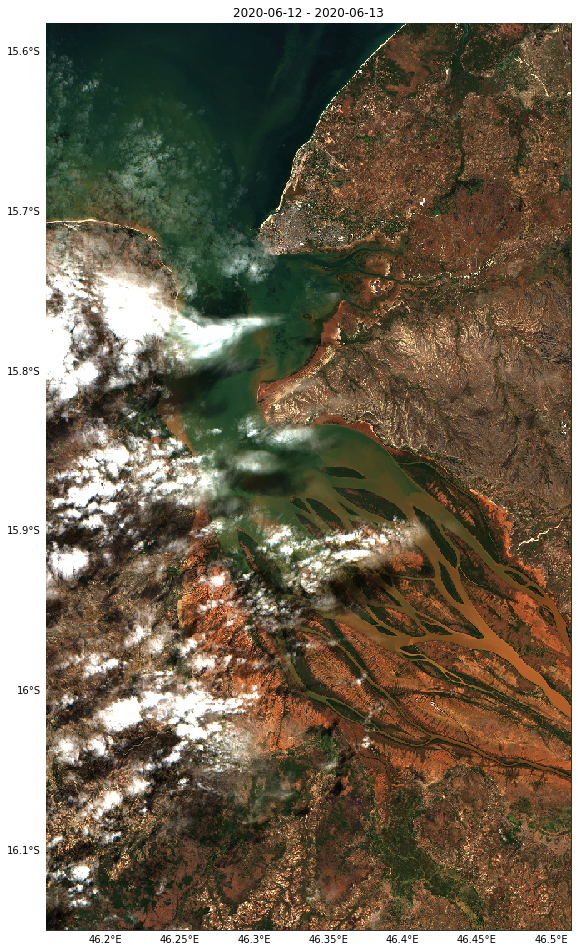

In [16]:
response.plotImages( 'default-vis', alpha={ 'data': 1.0, 'grid' : 0.0 } )

### _Configure monthly aggregation timeframes for generating mosaics_

In [17]:
# construct mosaic aggregation timeframes covering March - September 2020
import calendar

# set year
year = 2020

# for each month in year
timeframes = []
for month in range( 3, 9 ):
    last_day = calendar.monthrange( year, month )[ -1 ]
    timeframes.append( { 'start' : datetime( year, month, 1, 0, 0, 0 ), 
                            'end' : datetime( year, month, last_day, 23, 59, 59 ) } )

timeframes

[{'start': datetime.datetime(2020, 3, 1, 0, 0),
  'end': datetime.datetime(2020, 3, 31, 23, 59, 59)},
 {'start': datetime.datetime(2020, 4, 1, 0, 0),
  'end': datetime.datetime(2020, 4, 30, 23, 59, 59)},
 {'start': datetime.datetime(2020, 5, 1, 0, 0),
  'end': datetime.datetime(2020, 5, 31, 23, 59, 59)},
 {'start': datetime.datetime(2020, 6, 1, 0, 0),
  'end': datetime.datetime(2020, 6, 30, 23, 59, 59)},
 {'start': datetime.datetime(2020, 7, 1, 0, 0),
  'end': datetime.datetime(2020, 7, 31, 23, 59, 59)},
 {'start': datetime.datetime(2020, 8, 1, 0, 0),
  'end': datetime.datetime(2020, 8, 31, 23, 59, 59)}]

### _Download and display S2 True Colour mosaics generated using 'most recent' aggregation option_

In [18]:
# default mosaic order - use most recent imagery
_input = config.request.inputs[ 0 ] 
_input.mosaic.order

'mostRecent'

In [19]:
# get mosaic between timeframe
response = client.getMosaics ( bbox, timeframes, resolution )
response._df

,default,start,end
0,"[[[4, 11, 9], [3, 11, 8], [3, 10, 8], [3, 10, ...",2020-03-01,2020-03-31 23:59:59
1,"[[[3, 8, 7], [3, 8, 7], [3, 8, 7], [3, 8, 7], ...",2020-04-01,2020-04-30 23:59:59
2,"[[[2, 6, 7], [2, 6, 7], [2, 6, 7], [2, 6, 7], ...",2020-05-01,2020-05-31 23:59:59
3,"[[[1, 6, 6], [1, 6, 6], [2, 6, 6], [2, 6, 6], ...",2020-06-01,2020-06-30 23:59:59
4,"[[[76, 87, 91], [79, 88, 93], [69, 77, 81], [5...",2020-07-01,2020-07-31 23:59:59
5,"[[[4, 12, 10], [4, 12, 10], [4, 12, 10], [4, 1...",2020-08-01,2020-08-31 23:59:59


C:\Users\crwil\Documents\GitHub\sentinelhub\src\response.py:201: MatplotlibDeprecationWarning: 
The mpl_toolkits.legacy_colorbar rcparam was deprecated in Matplotlib 3.4 and will be removed two minor releases later.
  plt.rcParams[ 'mpl_toolkits.legacy_colorbar' ] = False
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


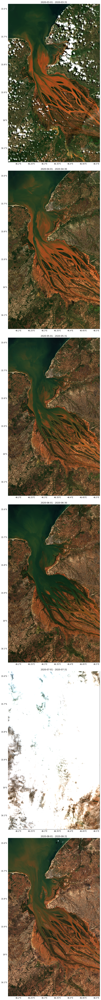

In [20]:
response._df[ 'default-vis' ] =  response._df[ 'default' ] * factor
response.plotImages( 'default-vis', alpha={ 'data': 1.0, 'grid' : 0.0 } )

### _Download and display S2 True Colour mosaics generated using 'least cloud' aggregation option_

In [21]:
# update configuration - construct mosaics by minimising cloud contamination
config.request.inputs[ 0 ].mosaic.order='leastCC'
client.setConfiguration( config )

In [22]:
# dump request to validate options
request = client.getRequest( bbox, timeframe, resolution )
request.payload

{'input': {'bounds': {'properties': {'crs': 'http://www.opengis.net/def/crs/EPSG/0/32738'},
   'bbox': [624024.4177455723,
    8214123.092150291,
    661906.5817265537,
    8276948.668998141]},
  'data': [InputDataDict({'type': 'sentinel-2-l2a', 'dataFilter': {'timeRange': {'from': '2020-06-12T00:00:00Z', 'to': '2020-06-13T00:00:00Z'}, 'mosaickingOrder': 'leastCC'}}, service_url=https://services.sentinel-hub.com)]},
 'evalscript': '//VERSION=3\nfunction setup() {\n    return {\n        input: [{\n            bands: ["B04", "B03", "B02"]\n        }],\n        output: {\n            bands: 3\n        }\n    };\n}\nfunction evaluatePixel(sample) {\n    return [sample.B04, sample.B03, sample.B02];\n}\n',
 'output': {'responses': [{'identifier': 'default',
    'format': {'type': 'image/tiff'}}],
  'width': 631,
  'height': 1047}}

In [23]:
# generate mosaics between timeframe list
response = client.getMosaics ( bbox, timeframes, resolution )
response._df

,default,start,end
0,"[[[6, 13, 11], [6, 13, 11], [6, 13, 11], [6, 1...",2020-03-01,2020-03-31 23:59:59
1,"[[[3, 9, 8], [3, 9, 8], [3, 10, 8], [3, 9, 8],...",2020-04-01,2020-04-30 23:59:59
2,"[[[2, 6, 7], [2, 6, 7], [2, 6, 7], [2, 6, 7], ...",2020-05-01,2020-05-31 23:59:59
3,"[[[1, 6, 6], [1, 6, 6], [2, 6, 6], [2, 6, 6], ...",2020-06-01,2020-06-30 23:59:59
4,"[[[6, 13, 10], [8, 14, 10], [7, 13, 10], [6, 1...",2020-07-01,2020-07-31 23:59:59
5,"[[[4, 13, 9], [5, 13, 9], [4, 13, 9], [5, 13, ...",2020-08-01,2020-08-31 23:59:59


C:\Users\crwil\Documents\GitHub\sentinelhub\src\response.py:201: MatplotlibDeprecationWarning: 
The mpl_toolkits.legacy_colorbar rcparam was deprecated in Matplotlib 3.4 and will be removed two minor releases later.
  plt.rcParams[ 'mpl_toolkits.legacy_colorbar' ] = False
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


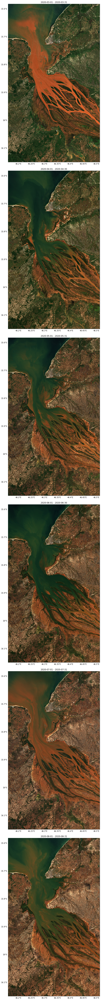

In [24]:
# enhance image contrast by applying stretch
response._df[ 'default-vis' ] =  response._df[ 'default' ] * factor
response.plotImages( 'default-vis', alpha={ 'data': 1.0, 'grid' : 0.0 } )